In [45]:
'''
Explantion of split_count_select()
Splits a large image into subimages of equal size (have to give it a number of subimages to split into).
For each subimage:
1. Performs Otsu threshold and uses results to determine blocksize and iterations.
2. Performs adaptive thresholding using selected blocksize and iterations. Removes noise.
3. Calculates a score for the result based on scale size variation and uniformity of distribution.
The lower the score, the better.
4. If the score is too high, repeat steps 1-3 on inverted image and see if the score for the inverted
image is lower. Keep the one with lower score.

Finally, choose the 3 subimages with the lowest (best) scores (printed in a list at the bottom as SELECTED SUBIMAGES)

Explantion of run_count_on_directory()
Does the same as split_count_select but does not split images and therefore does not choose best segments.

'''

'\nExplantion of split_count_select()\nSplits a large image into subimages of equal size (have to give it a number of subimages to split into).\nFor each subimage:\n1. Performs Otsu threshold and uses results to determine blocksize and iterations.\n2. Performs adaptive thresholding using selected blocksize and iterations. Removes noise.\n3. Calculates a score for the result based on scale size variation and uniformity of distribution.\nThe lower the score, the better.\n4. If the score is too high, repeat steps 1-3 on inverted image and see if the score for the inverted\nimage is lower. Keep the one with lower score.\n\nFinally, choose the 3 subimages with the lowest (best) scores (printed in a list at the bottom as SELECTED SUBIMAGES)\n\nExplantion of run_count_on_directory()\nDoes the same as split_count_select but does not split images and therefore does not choose best segments.\n\n'

In [2]:
import cv2
import numpy as np
from datascience import *
import matplotlib as mpl
from matplotlib import pyplot as plt
import sys
import os
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi'] = 120
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
import pandas
import statistics
import image_slicer

#plt.subplots_adjust(left=1, bottom=1, right=1, top=1, wspace=.9, hspace=1)

img_names = []
count_list = []
quality_list = []
image_size_split = []

In [3]:
#perhaps we could make a distribution of distances as well looking at distance between all points

from scipy.spatial.distance import pdist as pdist


#perhaps we can only look at close scales that are of similar size
def dist_dist(c):
    dm = pdist(c, 'euclidean')

def shortest_distance(n, c):
    min_dis = np.inf
    for i in c:
        if (i[0] != n[0] and i[1] != n[1]) and sum((n - i)**2)**.5 < min_dis :
             min_dis = sum((n - i)**2)**.5 
    return min_dis


def avg_shortest_distance(centroids):
    #This goes through and looks at the avg distance between the scales.
    index = 0
    
    shortest_dis = []
    #iterates through every center
    for i in np.arange(0, len(centroids)):
        c = centroids[i]
        #for the given center then compare to all the other c
        shortest_dis.append(shortest_distance(c, centroids))
        
    print("avg shortest distance", np.std(shortest_dis), np.mean(shortest_dis))
    return np.std(shortest_dis), np.mean(shortest_dis)



In [4]:
distance_standard_deviations = []
average_shortest_distances_squared = []

In [5]:
def threshold_otsu(img):
    '''Parameter img should already have been read by cv2 and converted to grayscale.
    Returns sure foreground of image thresholded using Otsu.'''
    # Apply blur
    blur = cv2.GaussianBlur(img,(5,5),1)
    blur = cv2.GaussianBlur(img,(5,5),1)


    # Threshold image using Otsu
    ret, thresh = cv2.threshold(blur,0 , 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    
    # Perform opening on thresholded image
    kernel = np.ones((3,3),np.uint8)
    opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 4)

    # Finding sure foreground area
    dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
    ret, sure_fg = cv2.threshold(dist_transform, .25, 255, 0)
    
#     plt.imshow(thresh, 'gray')
#     plt.show()
    return sure_fg

In [6]:
def choose_blocksize_and_iterations(img):
    '''Parameter img should be the sure foreground of the Otsu-thresholded image.
    Returns selected blocksize and iterations.'''
    
    # Collect stats from image
    binary_map = (img > 0).astype(np.uint8)
    connectivity = 4 # can be changed
    output = cv2.connectedComponentsWithStats(binary_map, connectivity, cv2.CV_32S)
   
    num_labels = output[0]
    labels = output[1]
    stats = output[2]
    centroids = output[3]
    
    avg_scale_size = np.average(stats[1:,-1])
    
    #added this line of code to find "uniformity"
    distance_std, avg_shortest_dis_squared = avg_shortest_distance(centroids)
    distance_standard_deviations.append(distance_std)
    
    dist_dist(centroids)
    
    average_shortest_distances_squared.append(avg_shortest_dis_squared)
    
    
    print('Block size from formula:', avg_shortest_dis_squared + np.sqrt(avg_scale_size) + int(.214*np.sqrt(avg_scale_size)))
    
    block_size = int(avg_shortest_dis_squared + np.sqrt(avg_scale_size) + int(.214*np.sqrt(avg_scale_size))/2)
    
    iterations = 0 
    
    if block_size % 2 == 0:
        block_size = block_size + 1
    
    if block_size > 85:
        iterations = 1
    else:
        iterations = min(int(block_size/15), 3)
        
    return block_size, iterations


#     if num_labels <= 3:
#         return 15, 1
#     elif avg_scale_size < 350:
#         return 65, 2
#     elif avg_scale_size < 550:
#         return 65, 3
#     else:
#         return 85, 1

In [7]:
def threshold_adaptive(img, blocksize, iterations):
    '''Parameter img should already have been read by cv2 and converted to grayscale.
    Performs adaptive thresholding on img using given blocksize and iterations.
    Returns resulting:
        -sure foreground with noise (for displaying purposes)
        -noise-removed image with scales labeled
        -scale count'''

        
    odd_median_blur_value = int(blocksize/2)
    if odd_median_blur_value %2 == 0:
        odd_median_blur_value = odd_median_blur_value + 1
    cv2.medianBlur(img, odd_median_blur_value)

    if (blocksize > 15):
        #blur = cv2.GaussianBlur(img,(5,5),1)
        blur = cv2.bilateralFilter(img,10,10,200)
        #could make more specific to be distance - scale size 
        #cv2.medianBlur(img, 5)
    
    else:
        #blur = cv2.medianBlur(img, 5)
        blur = cv2.GaussianBlur(img,(5,5),0)

        
    # Collect stats from thresh image

    thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, blocksize, -2)
    
#     print('Adaptive Thresholding')
#     plt.imshow(thresh, 'gray')
#     plt.show()
    
    binary_map = (thresh > 0).astype(np.uint8)
    connectivity = 4 # can be changed
    output = cv2.connectedComponentsWithStats(binary_map, connectivity, cv2.CV_32S)
   
    num_labels = output[0]
    labels = output[1]
    stats = output[2]
    centroids = output[3]
    
    scale_sizes = np.copy(stats[1:,-1]) # start from 1 instead of 0 to ignore background, use copy so that stats array doesn't get modified
    scale_sizes.sort() # sort the list of scale sizes from smallest to largest
    avg_scale_size = np.average(scale_sizes[len(scale_sizes) // 2:]) # average size among the largest half of the scales
    

    
    #
    
    thresh2 = cv2.bitwise_not(thresh)
    contour,hier = cv2.findContours(thresh2 ,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

    for cnt in contour:
        if cv2.contourArea(cnt) < avg_scale_size/5:
            thresh2 = cv2.drawContours(thresh2, [cnt], -1, (0,0,0), -1)

    thresh = cv2.bitwise_not(thresh2)

#     print('Filling Holes')
#     plt.imshow(thresh, 'gray')
#     plt.show()
    
    #adding

    kernel = np.ones((3,3),np.uint8)
    opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = iterations)

    # Finding sure foreground area
    dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
    ret, sure_fg = cv2.threshold(dist_transform, 1.5 , 255, 0) 

    # Collect stats from sure_foreground image
    binary_map = (sure_fg > 0).astype(np.uint8)
    connectivity = 4 # can be changed
    output = cv2.connectedComponentsWithStats(binary_map, connectivity, cv2.CV_32S)
   
    num_labels = output[0]
    labels = output[1]
    stats = output[2]
    centroids = output[3]
    
    scale_sizes = np.copy(stats[1:,-1]) # start from 1 instead of 0 to ignore background, use copy so that stats array doesn't get modified
    scale_sizes.sort() # sort the list of scale sizes from smallest to largest
    avg_scale_size = np.average(scale_sizes[len(scale_sizes) // 2:]) # average size among the largest half of the scales
    
    # Remove the identified noise
        # Removing noise
    for i in range(num_labels):
        # If a scale is smaller than 1/10 the average among the largest half of the scales
        if stats[i, cv2.CC_STAT_AREA] < (avg_scale_size / 7):
            noise_left = stats[i, cv2.CC_STAT_LEFT]
            noise_top = stats[i, cv2.CC_STAT_TOP]
            # Go through the bounding box of the noise and find all the pixels that are part of the noise
            for x in range(noise_left, noise_left + stats[i, cv2.CC_STAT_WIDTH]):
                for y in range(noise_top, noise_top + stats[i, cv2.CC_STAT_HEIGHT]):
                    if labels[y][x] == i: # If the pixel is part of the noise
                        labels[y][x] = 0 # Remove the noise by replacing the pixel with the background label
            num_labels -= 1
    # Note: Noise has been removed from labels matrix, but the noise is still in stats/centroids matrices.
    # This is ok because we don't use these outdated stats/centroids matrices again (in later functions, we create updated stats matrices by calling connected components again on the noise-removed image.)
    # Label and count
    # source: https://medium.com/analytics-vidhya/images-processing-segmentation-and-objects-counting-in-an-image-with-python-and-opencv-216cd38aca8e
    label_hue = np.uint8(179 * labels / np.max(labels))
    blank_ch = 255 * np.ones_like(label_hue)
    labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])
    labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)
    labeled_img[label_hue == 0] = 0

    return sure_fg, blur, labeled_img, num_labels - 1 # background doesn't count as a scale

In [8]:
def overlay(bw_img, color_mask, w1=0.2, w2=0.95):
    a = cv2.cvtColor(bw_img, cv2.COLOR_GRAY2RGB)
    a -= np.min(a)
    a = a/np.max(a)*255
    a = np.clip(a, a_min=0, a_max=255).astype(int)
    b = np.clip(color_mask, a_min=0, a_max=255).astype(int)
    c = cv2.addWeighted(b,w1,a,w2,0)
    return c

In [9]:
def display_results_orig(orig, blurred_img, with_noise, noise_removed, count):

    plt.subplot(1,5,1), plt.imshow(orig, 'gray')
    plt.title("Orginal Grayscale", fontsize=5)
    plt.tight_layout()

    plt.subplot(1,5,2), plt.imshow(blurred_img, 'gray')
    plt.title("Blurred Image", fontsize=5)
    plt.tight_layout()

    plt.subplot(1,5,3), plt.imshow(with_noise, 'gray')
    plt.title("With Noise", fontsize=5)
    plt.tight_layout()

    plt.subplot(1,5,4), plt.imshow(noise_removed, 'gray')
    plt.title("Noise-Removed, Count = " + str(count), fontsize=5)
    plt.tight_layout()

    plt.subplot(1,5,5), plt.imshow(overlay(orig, noise_removed))
    plt.title("Noise-Removed, Count = " + str(count), fontsize=5)
    plt.tight_layout()
    plt.show()
    
def display_results_invert(orig, invert, with_noise, noise_removed, count):
    plt.subplot(1,4,1), plt.imshow(orig, 'gray')
    plt.title("Orginal Grayscale", fontsize=5)
    plt.subplot(1,4,2), plt.imshow(invert, 'gray')
    plt.title("Inverted", fontsize=5)
    plt.subplot(1,4,3), plt.imshow(with_noise, 'gray')
    plt.title("Inverted With Noise", fontsize=5)
    plt.subplot(1,4,4), plt.imshow(noise_removed, 'gray')
    plt.title("Inverted Noise-Removed, Count = " + str(count), fontsize=5)
    plt.show()

In [46]:
def calculate_score(img):
    '''Parameter img should already have scales labeled.
    Calculates and returns score based on average scale size variation and uniformity of scale distribution.
    THE LOWER THE SCORE, THE BETTER.'''
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    binary_map = (img > 0).astype(np.uint8) # make the labeled image binary (make everything that is not black be white)
    
    # we need to collect new data on connected components (rather than using previous stats array) because the noise-removal method in threshold_custom changed the image but not the stats array
    output = cv2.connectedComponentsWithStats(binary_map, 4, cv2.CV_32S)
    num_labels = output[0]
    labels = output[1]
    stats = output[2]
    centroids = output[3]
    
    # if there's less than 3 scales (num_labels = num_scales + 1 b/c of background), the checks won't work because standard deviation requires at least 2 points (two distances for distribution function)
    # Result is probably bad if there's zero or 1 scale, but I'm not sure about 2...
    if num_labels <= 3:
        return 100 #this is a random high value I chose to show that the result is not good
    
    size_var = scale_size_variation(num_labels, stats, len(img), len(img[0]))
    dis = distribution(num_labels, centroids)
    
    #Decided not to use overlap/fullness/squareness, but kept them here in comments just in case
    #overlap = overlap_of_bounds(num_labels, stats, len(img), len(img[0])) #bounding box overlap not that useful - maybe only use to eliminate if extremely high, like > 1?
    #fullness, squareness = fullness_and_squareness(num_labels, stats, len(img), len(img[0]))
    
    print("Size variation: " + str(size_var))
    print("Distribution: " + str(dis))
    
    score = (size_var + dis) / 2 # score is the average of size variation and distribution
    print("Overall score: " + str(score))

    return score

    
def bounding_box_edges(i, stats):
    '''Returns coordinates of edges of the bounding box at index i in stats array'''
    left = stats[i, cv2.CC_STAT_LEFT]
    right = left + stats[i, cv2.CC_STAT_WIDTH] - 1
    top = stats[i, cv2.CC_STAT_TOP]
    bottom = top + stats[i, cv2.CC_STAT_HEIGHT] - 1
    return left, right, top, bottom
        
def scale_size_variation(num_labels, stats, img_len, img_width):
    '''Returns average variation in scale size, calculated without edge scales (except in the case where there are not enough non-edge scales).
    High variation likely corresponds to poor quality results.
    Result is considered very good if return value is less than 1.
    Only works if there is at least 2 scales.''' # add assertion error check for this?
    scale_areas = []
    edge_scale_areas = []
    for i in range(1, num_labels): # start at 1 to ignore background
        
        # don't consider scales that touch the edge
        left, right, top, bottom = bounding_box_edges(i, stats)
        if left == 0 or top == 0 or right == img_width - 1 or bottom == img_len - 1:
            edge_scale_areas.append(stats[i, cv2.CC_STAT_AREA].astype(int))
            continue
            
        scale_areas.append(stats[i, cv2.CC_STAT_AREA].astype(int))

    # if 1 or zero non-edge scales, then use edge scales in calculation (otherwise, do not use edge scales)
    if len(scale_areas) < 2:
        scale_areas = scale_areas + edge_scale_areas
        
    stddev = statistics.stdev(scale_areas)
    mean = sum(scale_areas) / len(scale_areas)
    #print("(Std dev / mean) for scale area: " + str(stddev / mean))

    for edge_scale_area in edge_scale_areas: # if any of the edge scales are more than five times the average size of the non-edge scales, this is bad
        if edge_scale_area > 5*mean:
            return 100 # this is bad so return a really high value

    # thresholding good if return value less than 1
    return (stddev / mean) # figure out if dividing by mean makes any sense

def distribution(num_labels, centroids):
    '''Calculates and returns the standard deviation of the distances between the centroids of neighboring scales.
    The lower the return value, the more uniform the distribution of scales.
    Only works if there is at least 3 scales (2 distances to compare)''' # add assertion error check for this?
    x_values = []
    y_values = []
    for i in range(1, num_labels):
        x_values.append(centroids[i, 0])
        y_values.append(centroids[i, 1])
    x_values.sort()
    y_values.sort()
    
    x_diff = []
    y_diff = []
    for i in range(1, len(x_values)):
        x_diff.append(x_values[i] - x_values[i-1]) # differences between neighboring x-coordinates
        y_diff.append(y_values[i] - y_values[i-1]) # differences between neighboring y-coordinates
    
    x_stddev = statistics.stdev(x_diff)
    y_stddev = statistics.stdev(y_diff)
    avg_stddev = (x_stddev + y_stddev) / 2
    return avg_stddev

# ***Currently not used***
# Not used because most images have little overlap of bounds, regardless of how good the thresholding is
def overlap_of_bounds(num_labels, stats, img_len, img_width):
    '''Returns average overlap of the bounding boxes of the scales.
    More overlap suggests that the identified scales are not localized; rather, they weave around one another.
    Result is considered good if return value is less than 0.63.'''
    if num_labels < 2: # return None if no scales
        return
    #check for overlappingness of bounding boxes
    overlap_array = np.zeros((img_len, img_width))
    for i in range(1, num_labels): # start at 1 to ignore background
        left, right, top, bottom = bounding_box_edges(i, stats)
        for r in range(top, bottom + 1):
            for c in range(left, right + 1):
                overlap_array[r, c] += 1
    avg_overlap = np.average(overlap_array)
    #print("Avg bounding box overlap: " + str(avg_overlap))
    percent_overlap = np.count_nonzero(overlap_array > 1) / np.size(overlap_array)
    
    # thresholding good if return value less than 0.63
    return avg_overlap

# ***Currently not used***
# Produces inconsistent results (often wrong)
def fullness_and_squareness(num_labels, stats, img_len, img_width):
    '''Returns average fullness and squareness of the scales.
    Fullness is the ratio of the area of the scale to the area of the bounding box.
    Squareness is the ratio width:length of the bounding box.
    Greater fullness suggests that the scale is solid and full rather than webbed or full of holes.
    Greater squareness suggests that the scale is square/circular rather than long and skinny.
    Results considered good if fullness > 0.7 and squareness > 0.5.'''
    squareness = []
    fullness = []
    for i in range(1, num_labels):
        
        left, right, top, bottom = bounding_box_edges(i, stats)
        # don't consider scales that touch the edge
        if left == 0 or top == 0 or right == img_width - 1 or bottom == img_len - 1:
            continue
            
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]
        squareness.append(min(w, h) / max(w, h)) # closer to 1 means more square, smaller than 1 means less square
        
        scale_area = stats[i, cv2.CC_STAT_AREA]
        box_area = w * h
        fullness.append(scale_area / box_area)
    if fullness:
        avg_fullness = sum(fullness) / len(fullness)
        #print("Avg fullness: " + str(avg_fullness))
        squareness.sort()
        least_square = squareness[:10]
        avg_squareness = sum(least_square) / len(least_square)
        #print("Avg squareness of 10 least square scales: " + str(avg_squareness))
    
        # thresholding good if fullness > 0.7 and squareness > 0.5
        return avg_fullness, avg_squareness
    else:
        return None, None
    # returns None if no non-edge scales

In [11]:
def compare_results(score_list, num_to_keep):
    '''Compares the scores from different thresholding attempts and returns the indices corresponding to the best one(s).
    The second return value is a boolean indicating whether the best result passes a quality-check.
    Parameters: score_list is a list of scores for each image from calculate_score,
    num_to_keep is the number of images that we want to keep.'''
    
    # Return the indices corresponding to the best results - remember, the lower the score, the better
    best_indices = []
    for i in range(len(score_list)):
        if len(best_indices) < num_to_keep:
            best_indices.append(i)
        else:
            current_worst_score = max([score_list[i] for i in best_indices])
            if score_list[i] < current_worst_score: # if the score is better than the previous scores
                best_indices.remove(score_list.index(current_worst_score)) # remove the index corresponding to lowest score
                best_indices.append(i)
    
    # if any of the selected images have poor quality, say so
    for i in best_indices:
        if score_list[i] > 5: # if the score is too high (change this value later)
            print("Could not find " + str(num_to_keep) + " subimages that pass the quality check.")
        
    return best_indices

In [12]:
def invert(img):
    '''Inverts a grayscale image.'''
    return cv2.bitwise_not(img)

In [13]:
def count_scales(img):
    '''Parameter img must already have been read into cv2 and converted to grayscale.
    Calls threshold_otsu, then choose_blocksize_and_iterations, then threshold_adaptive.
    Returns resulting images and count.'''
    img_otsu = threshold_otsu(img)
    blocksize, iterations = choose_blocksize_and_iterations(img_otsu)
    print("Blocksize, iterations: " + str(blocksize) + ", " + str(iterations))
    with_noise, blurred_img, labeled_img, count = threshold_adaptive(img, blocksize, iterations)
    return with_noise, blurred_img, labeled_img, count

In [31]:
def call_count_scales_and_check_inversion(img):
    '''Main function that calls all the other functions.
    Parameter img should have already been read into cv2.
    Counts scales on original image, checks result, and counts scales on inverted image if needed.
    Finally, compares results from original vs. inverted image, and displays results from the better one.'''
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    print("Original Image:")
    # count scales on original image
    with_noise, blurred_img, labeled_img, count = count_scales(img)
    
    # check how good the results are
    orig_score = calculate_score(labeled_img)
    

    # If the result is good, display results and finish
    if orig_score < 3:
        print("\nOriginal image passed all tests; did not need to check inverted.")
        display_results_orig(img, blurred_img, with_noise, labeled_img, count)
        best_labeled_image = labeled_img
        return count, orig_score, best_labeled_image

    # Otherwise, try inverted image and compare results to original
    else:
        # save the original results in lists for later use
        result_images = [[img, with_noise, labeled_img, count]]
    
        # invert image
        inverted_img = invert(img)
    
        # count scales on inverted image
        print('\nInverted Image:')
        with_noise, inverted_blurred_img, labeled_img, count = count_scales(inverted_img)
    
        # check how good the new results are
        inverted_score = calculate_score(labeled_img)
        score_list = [orig_score, inverted_score]
        
        # compare the results from original and inverted images
        best_index = compare_results(score_list, 1)
        best_index = best_index[0]
    
        
        if best_index == 0:
            print("\nTried both original and inverted, but decided to keep original.")
            best_labeled_image = result_images[0][2]
            display_results_orig(result_images[0][0],  blurred_img, result_images[0][1],best_labeled_image, result_images[0][3])
        elif best_index == 1:
            print("\nDECIDED TO USE INVERTED IMAGE.")
            best_labeled_image = labeled_img
            display_results_invert(img, inverted_img, with_noise, best_labeled_image, count)
        
        return count, score_list[best_index], best_labeled_image

In [32]:
def run_count_on_directory(dirname):
    '''Calls call_count_scales_and_check_inversion function on every image in the given directory.'''
    directory = os.scandir(dirname)
    
    for img in directory:
        if (img.name == '.ipynb_checkpoints' or img.name == '.DS_Store'): # need to figure how to remove these files
            continue
        img_names.append(img.name)
        print(img.name)
        img_arr = cv2.imread(dirname + img.name)
        count, score_list, best_labeled_image = call_count_scales_and_check_inversion(img_arr)

#     table = Table().with_columns("Img Name", img_names, "Number of Scales", count_list, "Passes Quality Check?", quality_list)
#     table.show()
    

In [42]:
def split_count_select(img_path, num_subimages, num_to_keep):
    '''Splits given image into subimages and selects best ones to keep. '''
    img = cv2.imread(img_path)
    img_size = img.shape
    tiles = image_slicer.slice(img_path, num_subimages)
    all_scores = []
    all_counts = []
    all_labeled = []
    i = 0
    for tile in tiles:
        print('SUBIMAGE #' + str(i) + ':\n')
        count, score_list, labeled_image = call_count_scales_and_check_inversion(np.asarray(tile.image))
        all_scores.append(score_list)
        all_counts.append(count)
        all_labeled.append(labeled_image)
        i += 1
    
    best_indices_lst = compare_results(all_scores, num_to_keep)
    
    estimated_total = estimate_total_counts(all_counts, best_indices_lst, num_subimages)
    print('ESTIMATED TOTAL COUNT:', estimated_total, "SCALES")
    print('\n_______________________________________________')
    print('\nSELECTED SUBIMAGES: ' + str(best_indices_lst))
    
    
    for i in np.arange(num_to_keep):
        plt.subplot(1,num_to_keep,i+1), plt.imshow(all_labeled[best_indices_lst[i]], 'gray')
        plt.title("Chosen Image: " + str(best_indices_lst[i]), fontsize=5)
    plt.show()

In [43]:
def estimate_total_counts(all_counts, best_indices, sub_img):
    return (sum([all_counts[i] for i in best_indices]) * sub_img / 3)    
print('here')

here


117716Ventral-NoFlash-3.png
Original Image:
avg shortest distance 17.934787887060043 36.37717340876365
406
Block size from formula: 59.19965237105006
Blocksize, iterations: 57, 3
Size variation: 0.5498608283012767
Distribution: 7.799463346257449
Overall score: 4.174662087279363

Inverted Image:
avg shortest distance 15.093675223611504 49.926591908292416
66
Block size from formula: 121.03512074989177
Blocksize, iterations: 115, 1
Size variation: 100
Distribution: 16.916267710220584
Overall score: 58.45813385511029

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


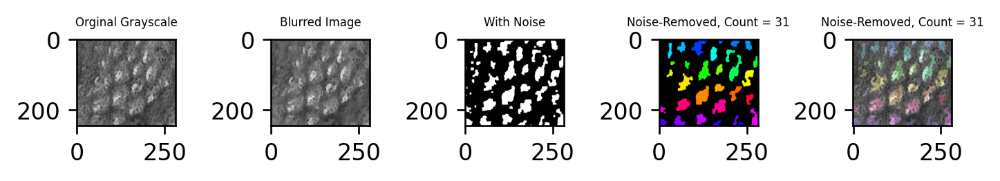

135185Ventral-NoFlash-3.png
Original Image:
avg shortest distance 15.443721110481379 61.01102784509498
946
Block size from formula: 115.69625012630667
Blocksize, iterations: 111, 1
Size variation: 0.322842501123643
Distribution: 11.016070145378063
Overall score: 5.669456323250853

Inverted Image:
avg shortest distance 62.11187644083335 70.21855409827695
78
Block size from formula: 185.49184521388815
Blocksize, iterations: 175, 1
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


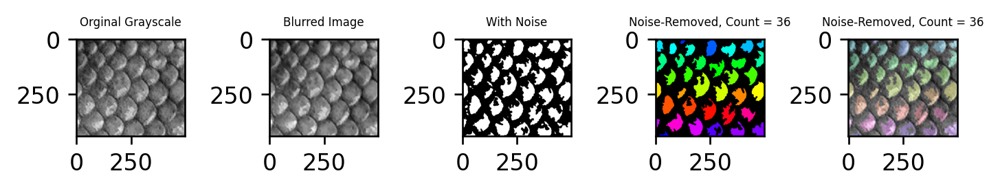

135185Ventral-NoFlash-2.png
Original Image:
avg shortest distance 15.033411490205925 57.86976285825457
190
Block size from formula: 135.9822161905271
Blocksize, iterations: 129, 1
Size variation: 0.5900934950288321
Distribution: 10.579521223538045
Overall score: 5.584807359283438

Inverted Image:
avg shortest distance 20.391306369076236 50.53105742747307
406
Block size from formula: 87.60182917750943
Blocksize, iterations: 85, 3
Size variation: 100
Distribution: 17.215930807044597
Overall score: 58.6079654035223
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


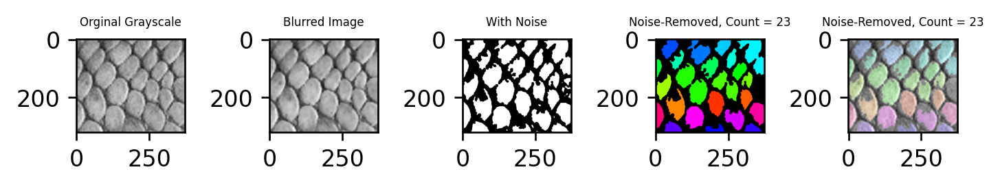

117704Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 3.211274676063538 21.163770763767957
3403
Block size from formula: 35.79358450435618
Blocksize, iterations: 35, 2
Size variation: 0.48012480535067775
Distribution: 2.118391572018571
Overall score: 1.2992581886846244

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


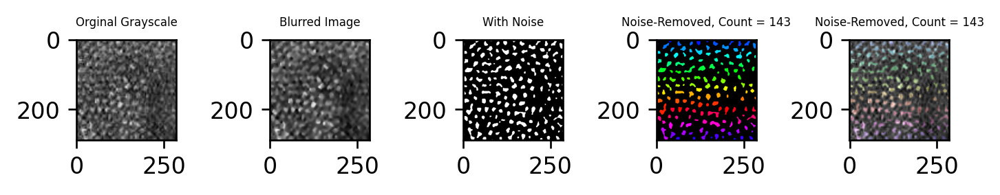

117716Ventral-NoFlash-2.png
Original Image:
avg shortest distance 18.267173434305032 50.82200074493621
595
Block size from formula: 70.0211292618004
Blocksize, iterations: 69, 3
Size variation: 0.6538931380258397
Distribution: 6.251318565557239
Overall score: 3.4526058517915392

Inverted Image:
avg shortest distance 0.0 31.886117547973804
1
Block size from formula: 510.0434465423742
Blocksize, iterations: 469, 1
Size variation: 100
Distribution: 45.202910336524766
Overall score: 72.60145516826239

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


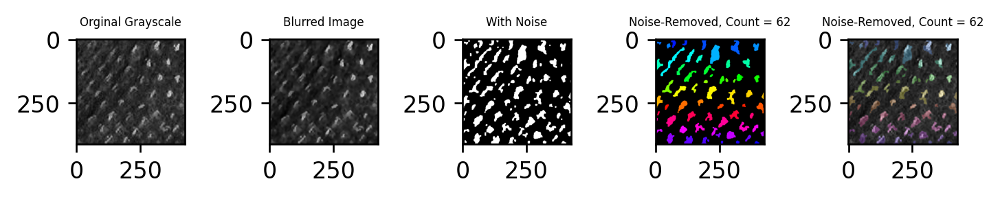

135185Ventral-NoFlash-1.png
Original Image:
avg shortest distance 15.005850998198168 51.05892891449764
528
Block size from formula: 119.78359286237837
Blocksize, iterations: 113, 1
Size variation: 0.353460748597705
Distribution: 8.492609864921569
Overall score: 4.423035306759637

Inverted Image:
avg shortest distance 14.959589591086951 45.18492339567793
1081
Block size from formula: 80.72855362211628
Blocksize, iterations: 77, 3
Size variation: 1.5336405857110773
Distribution: 65.16422672177934
Overall score: 33.34893365374521

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


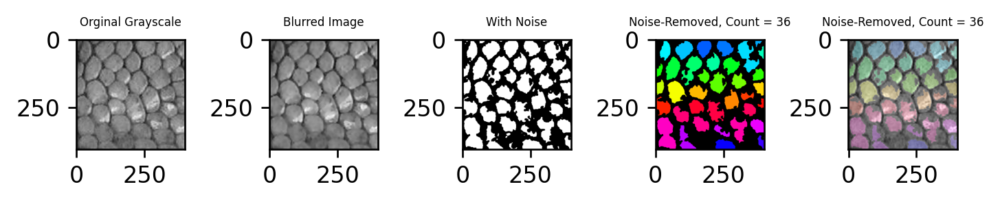

117704Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 5.652642309230829 23.983461176540086
1431
Block size from formula: 44.106765389507025
Blocksize, iterations: 43, 2
Size variation: 0.6077767101482241
Distribution: 3.410445109392227
Overall score: 2.0091109097702256

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


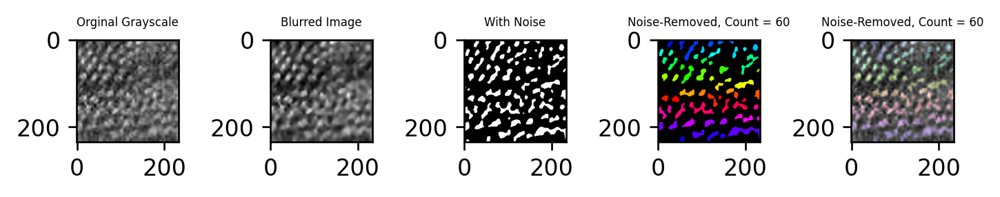

117716Ventral-NoFlash-1.png
Original Image:
avg shortest distance 22.196142214529335 41.78332392066518
2016
Block size from formula: 79.67251699481861
Blocksize, iterations: 77, 3
Size variation: 0.9150068931065354
Distribution: 6.027527188238212
Overall score: 3.4712670406723736

Inverted Image:
avg shortest distance 28.96186647121159 47.26986204106031
231
Block size from formula: 151.090272533803
Blocksize, iterations: 143, 1
Size variation: 100
Distribution: 48.762923958700554
Overall score: 74.38146197935028

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


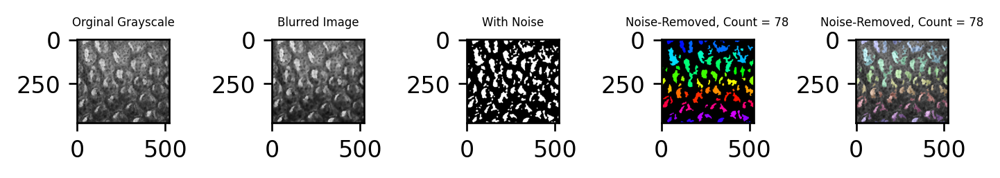

135193Dorsal-NoFlash-3.png
Original Image:
avg shortest distance 8.12633096106112 32.12462325331375
1711
Block size from formula: 51.331263016503186
Blocksize, iterations: 49, 3
Size variation: 0.40847719347960104
Distribution: 3.177805136045807
Overall score: 1.793141164762704

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


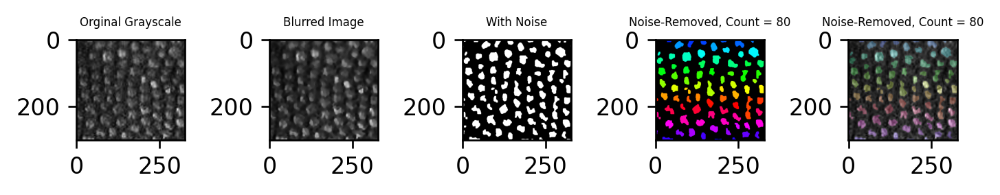

117718Dorsal-NoFlash-3.png
Original Image:
avg shortest distance 12.71962791992079 28.91385616893718
190
Block size from formula: 42.730436848108646
Blocksize, iterations: 41, 2
Size variation: 0.510298151664845
Distribution: 2.009228984174135
Overall score: 1.25976356791949

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


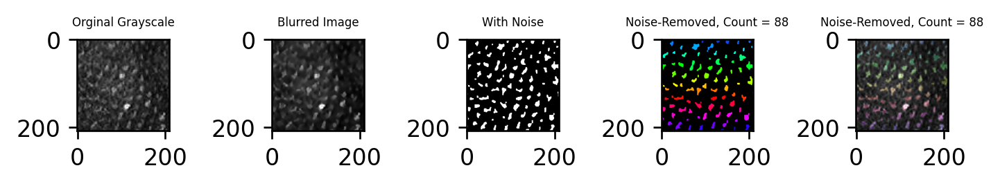

117716Ventral-NoFlash-5.png
Original Image:
avg shortest distance 11.097340045857173 28.76856021797109
325
Block size from formula: 42.17031446896247
Blocksize, iterations: 41, 2
Size variation: 0.7140971532848593
Distribution: 3.4242822497509557
Overall score: 2.0691897015179075

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


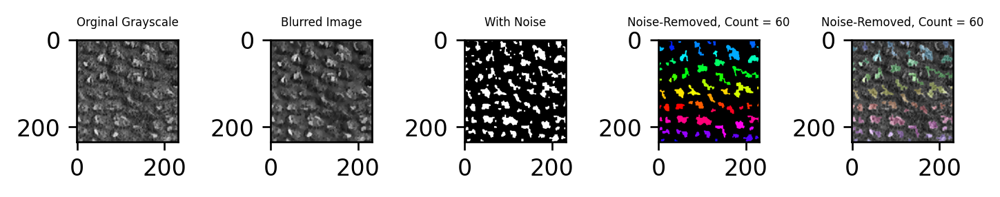

117702Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 11.643277046007633 29.83232638947209
465
Block size from formula: 60.69671632363962
Blocksize, iterations: 59, 3
Size variation: 0.9338030687777579
Distribution: 6.06253979783658
Overall score: 3.498171433307169

Inverted Image:
avg shortest distance 9.171566419582508 28.343464290691756
820
Block size from formula: 59.83261301238532
Blocksize, iterations: 57, 3
Size variation: 0.6573883159772567
Distribution: 4.154906422256535
Overall score: 2.406147369116896

DECIDED TO USE INVERTED IMAGE.


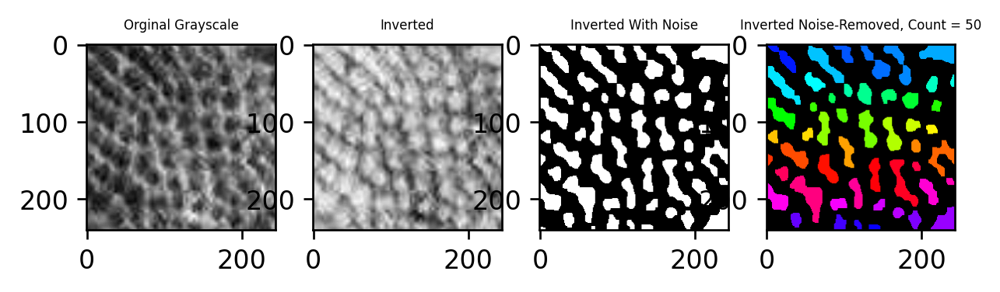

117704Ventral-NoFlash-1.png
Original Image:
avg shortest distance 13.484633757964229 37.36925776314115
300
Block size from formula: 56.69280925579535
Blocksize, iterations: 55, 3
Size variation: 0.7503091129078353
Distribution: 6.053560777747388
Overall score: 3.401934945327612

Inverted Image:
avg shortest distance 9.757761864258052 45.57697328053242
15
Block size from formula: 183.84857955260685
Blocksize, iterations: 171, 1
Size variation: 100
Distribution: 19.466441982146613
Overall score: 59.73322099107331

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


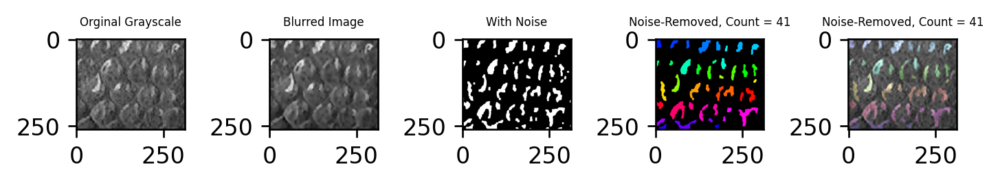

117716Ventral-NoFlash-4.png
Original Image:
avg shortest distance 24.70771724197027 41.37075224294957
171
Block size from formula: 69.85952024432041
Blocksize, iterations: 67, 3
Size variation: 0.5672296930528967
Distribution: 5.9871256626365605
Overall score: 3.277177677844729

Inverted Image:
avg shortest distance 18.722532510278004 49.671226609875056
36
Block size from formula: 135.0043624705773
Blocksize, iterations: 127, 1
Size variation: 100
Distribution: 12.870959741692317
Overall score: 56.43547987084616

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


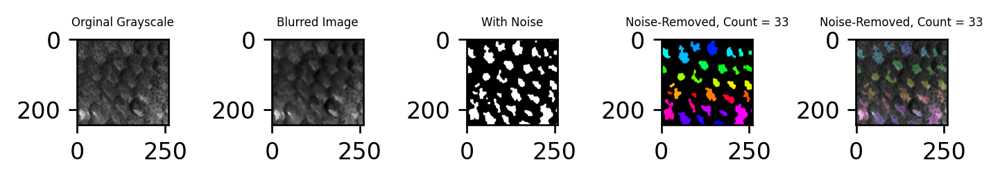

117718Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 4.143611340894529 23.801871979095235
210
Block size from formula: 42.73140430116923
Blocksize, iterations: 41, 2
Size variation: 100
Distribution: 1.862312310251642
Overall score: 50.93115615512582

Inverted Image:
avg shortest distance 7.994020451902852 22.887310936196982
595
Block size from formula: 57.93291402553788
Blocksize, iterations: 55, 3
Size variation: 100
Distribution: 4.418756590028265
Overall score: 52.20937829501413
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


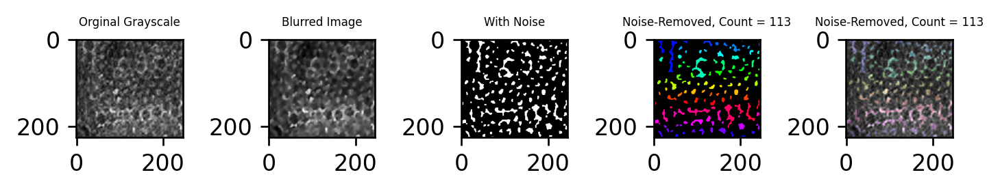

135193Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 6.798250573877193 28.702080369056088
1653
Block size from formula: 48.27038661712576
Blocksize, iterations: 47, 3
Size variation: 0.5522399467859025
Distribution: 3.4506143287594835
Overall score: 2.001427137772693

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


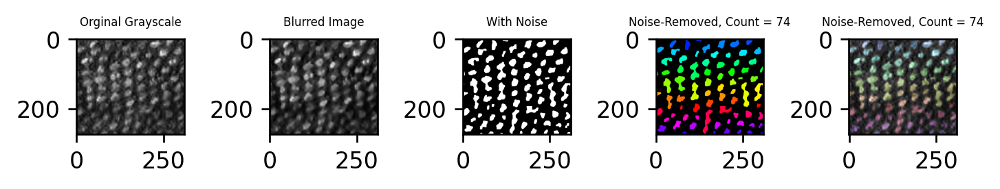

117716Ventral-NoFlash-6.png
Original Image:
avg shortest distance 9.53481543391399 27.476321967398004
300
Block size from formula: 57.13989159279219
Blocksize, iterations: 55, 3
Size variation: 0.6193549976635261
Distribution: 4.154440297766965
Overall score: 2.3868976477152457

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


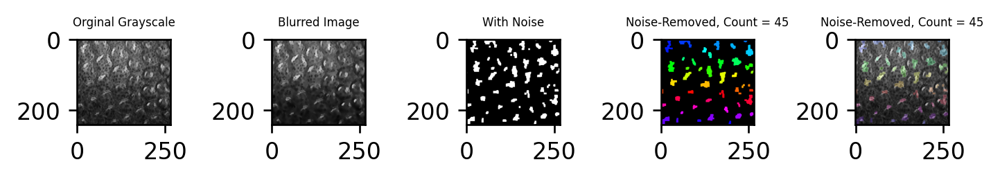

117704Ventral-NoFlash-2.png
Original Image:
avg shortest distance 4.495338353704337 23.6013872706569
253
Block size from formula: 41.18032600245266
Blocksize, iterations: 39, 2
Size variation: 0.42370514203578724
Distribution: 4.397449106448123
Overall score: 2.4105771242419554

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


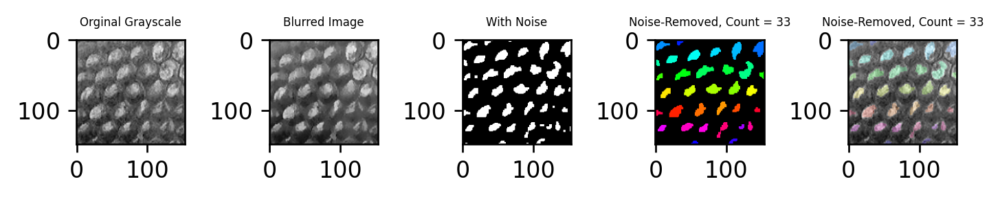

117702Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 13.37597849287445 25.036921469357427
946
Block size from formula: 45.52046855239098
Blocksize, iterations: 45, 3
Size variation: 100
Distribution: 4.529917787464996
Overall score: 52.2649588937325

Inverted Image:
avg shortest distance 9.191337950056353 28.231776528164534
780
Block size from formula: 65.88737513373387
Blocksize, iterations: 63, 3
Size variation: 100
Distribution: 6.823094143002795
Overall score: 53.411547071501396
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


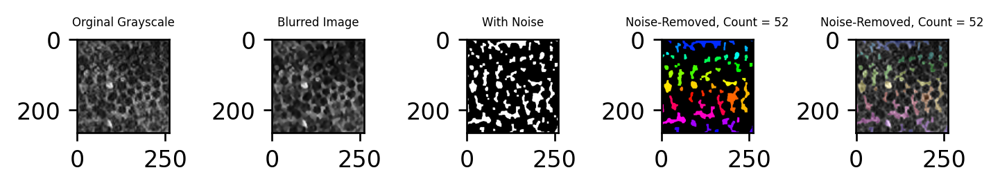

117718Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 13.235581909334826 30.373468934475504
351
Block size from formula: 43.584727012510626
Blocksize, iterations: 43, 2
Size variation: 0.86609126256731
Distribution: 1.5495881137604508
Overall score: 1.2078396881638804

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


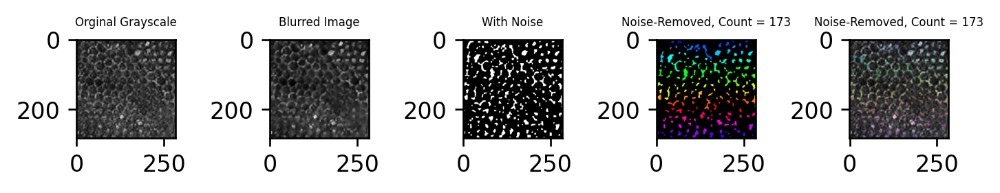

135193Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 9.032948647070537 31.60542856906219
1830
Block size from formula: 50.19388583718209
Blocksize, iterations: 49, 3
Size variation: 0.5015363482977272
Distribution: 3.472714084619063
Overall score: 1.9871252164583952

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


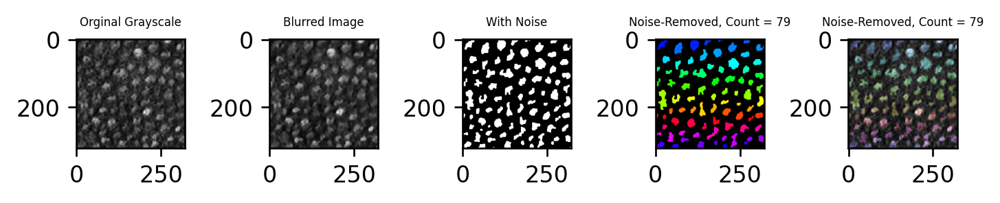

135185Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 8.150258636957428 27.44653009350444
1326
Block size from formula: 41.62816203929664
Blocksize, iterations: 41, 2
Size variation: 0.6963489304341054
Distribution: 2.3019639086231445
Overall score: 1.4991564195286249

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


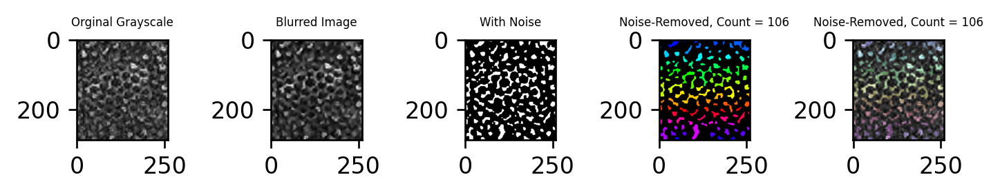

117718Ventral-NoFlash-2.png
Original Image:
avg shortest distance 13.583559269989713 34.93822084905028
496
Block size from formula: 61.04354059996822
Blocksize, iterations: 59, 3
Size variation: 0.543352323034817
Distribution: 7.0933929827623885
Overall score: 3.818372652898603

Inverted Image:
avg shortest distance 18.1282969767134 56.21255072392796
66
Block size from formula: 137.13380702904036
Blocksize, iterations: 131, 1
Size variation: 1.6089457764446458
Distribution: 52.44662049204541
Overall score: 27.027783134245027

Tried both original and inverted, but decided to keep original.


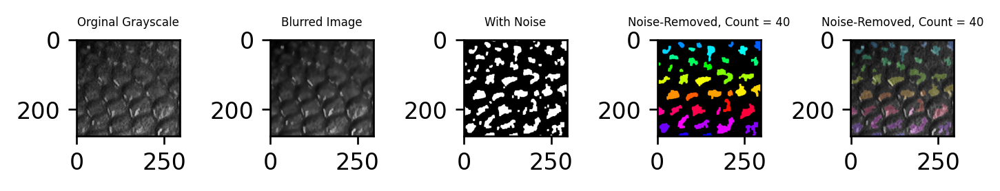

117718Ventral-NoFlash-3.png
Original Image:
avg shortest distance 16.734789771316052 34.1008364663599
378
Block size from formula: 51.62540058935385
Blocksize, iterations: 51, 3
Size variation: 0.7411017848597269
Distribution: 3.9607645968950704
Overall score: 2.3509331908773987

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


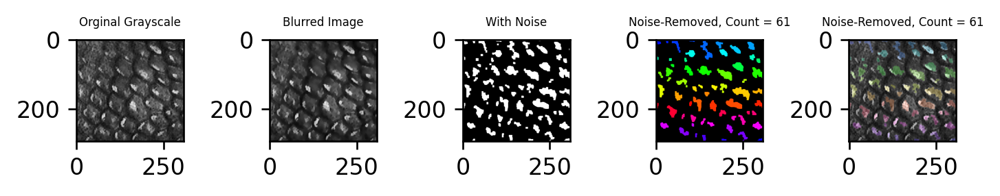

135193Ventral-NoFlash-4.png
Original Image:
avg shortest distance 6.3524208874631665 35.21256625677189
406
Block size from formula: 67.48500132014155
Blocksize, iterations: 65, 3
Size variation: 0.5153188507428068
Distribution: 4.902896966913271
Overall score: 2.709107908828039

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


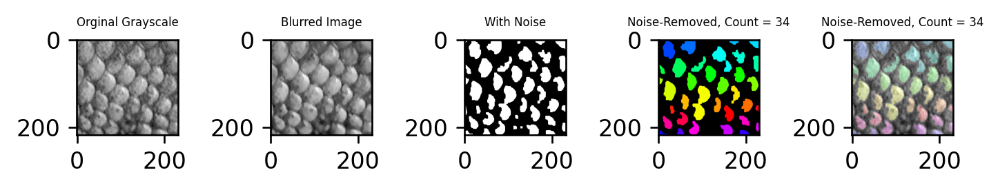

117716Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 7.760779730247761 26.712924348297786
3003
Block size from formula: 42.60209606258986
Blocksize, iterations: 41, 2
Size variation: 0.6801152404368623
Distribution: 1.9907133788953177
Overall score: 1.33541430966609

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


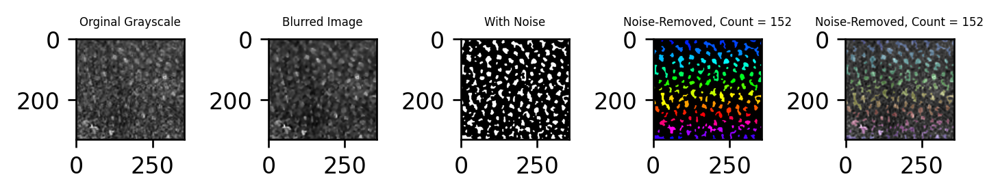

135185Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 6.460285237635812 24.58932322108996
1891
Block size from formula: 40.47114291566844
Blocksize, iterations: 39, 2
Size variation: 100
Distribution: 6.147440020367666
Overall score: 53.073720010183834

Inverted Image:
avg shortest distance 9.138280787382222 30.126638897668574
1176
Block size from formula: 64.42600579282484
Blocksize, iterations: 61, 3
Size variation: 100
Distribution: 4.8610014367815735
Overall score: 52.43050071839079
Could not find 1 subimages that pass the quality check.

DECIDED TO USE INVERTED IMAGE.


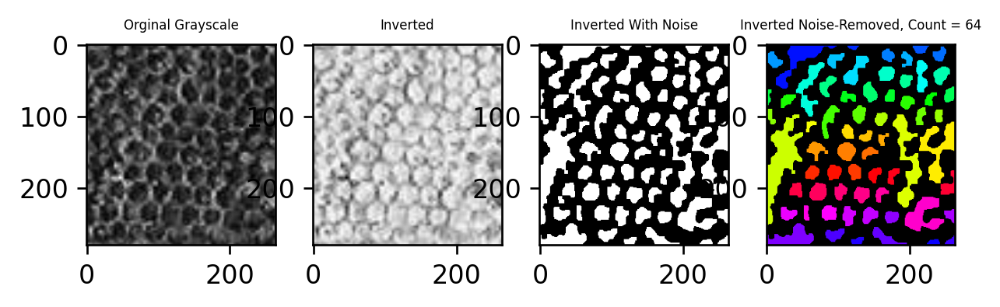

117718Ventral-NoFlash-1.png
Original Image:
avg shortest distance 14.278814094148629 35.58564336515772
153
Block size from formula: 77.4104148056475
Blocksize, iterations: 73, 3
Size variation: 0.7255987406700789
Distribution: 6.983503186179267
Overall score: 3.854550963424673

Inverted Image:
avg shortest distance 23.37045546559402 34.507979658703775
78
Block size from formula: 115.23503564051673
Blocksize, iterations: 109, 1
Size variation: 100
Distribution: 29.102881873756996
Overall score: 64.55144093687849

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


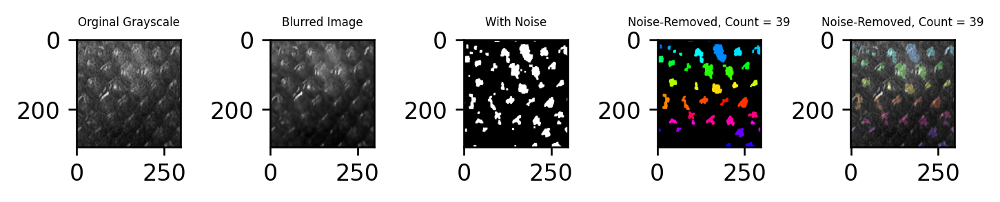

117716Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 5.757297968530795 27.18911034823767
2211
Block size from formula: 48.19121460234523
Blocksize, iterations: 47, 3
Size variation: 0.6058189733428231
Distribution: 2.1731020674055683
Overall score: 1.3894605203741957

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


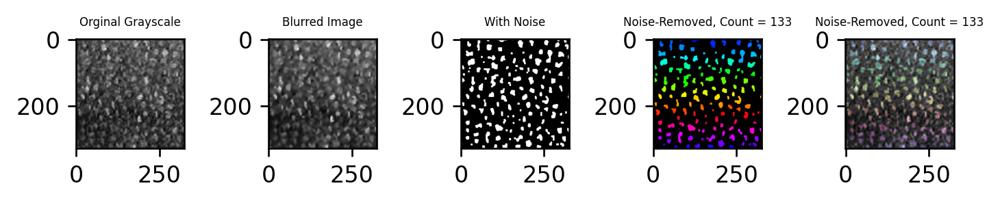

135182Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 10.044915030546393 29.683802737174883
528
Block size from formula: 42.95600305477038
Blocksize, iterations: 41, 2
Size variation: 0.5983989801805759
Distribution: 1.9541369091777603
Overall score: 1.276267944679168

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


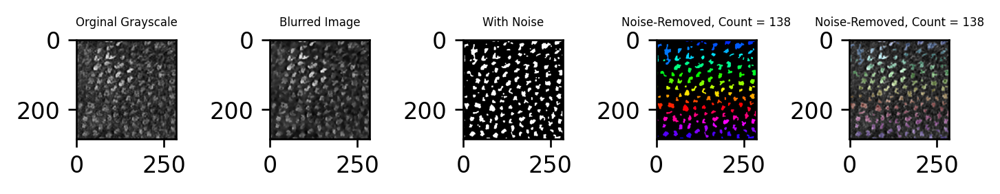

135193Ventral-NoFlash-3.png
Original Image:
avg shortest distance 6.917455059051317 38.685445884900425
595
Block size from formula: 74.27180999366632
Blocksize, iterations: 71, 3
Size variation: 0.49780822285305726
Distribution: 6.342475203537708
Overall score: 3.4201417131953824

Inverted Image:
avg shortest distance 14.755361321087305 39.03659610564015
210
Block size from formula: 84.85788640621027
Blocksize, iterations: 81, 3

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


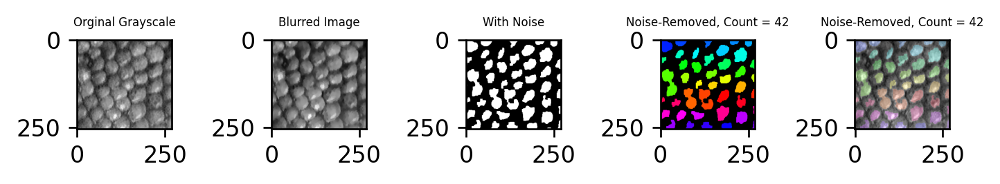

135196Ventral-NoFlash-2.png
Original Image:
avg shortest distance 3.595885670374614 25.684149786606074
561
Block size from formula: 45.916079276346736
Blocksize, iterations: 45, 3
Size variation: 0.47701592968932977
Distribution: 3.936206760286927
Overall score: 2.2066113449881284

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


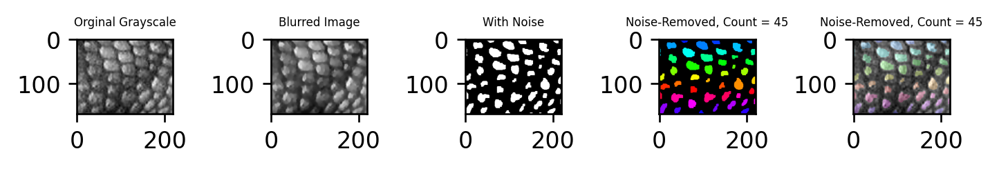

135196Ventral-NoFlash-3.png
Original Image:
avg shortest distance 10.626008759671112 36.538523360242
820
Block size from formula: 73.30538865393092
Blocksize, iterations: 71, 3
Size variation: 0.4208140166537477
Distribution: 5.374799970728638
Overall score: 2.897806993691193

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


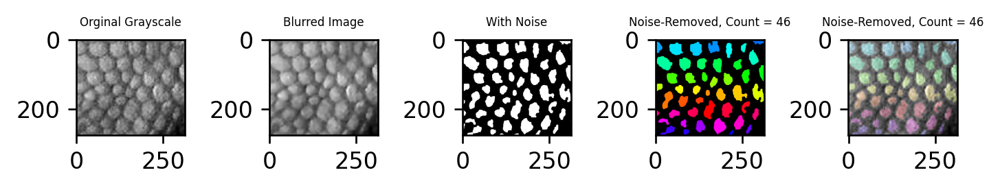

135193Ventral-NoFlash-2.png
Original Image:
avg shortest distance 7.800923416202924 31.053871182588374
741
Block size from formula: 60.33999457586965
Blocksize, iterations: 57, 3
Size variation: 0.3254061374608042
Distribution: 5.984311015906421
Overall score: 3.154858576683613

Inverted Image:
avg shortest distance 11.658887446840879 32.07663152391974
528
Block size from formula: 59.23842657525373
Blocksize, iterations: 57, 3
Size variation: 100
Distribution: 12.42282539749335
Overall score: 56.21141269874668

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


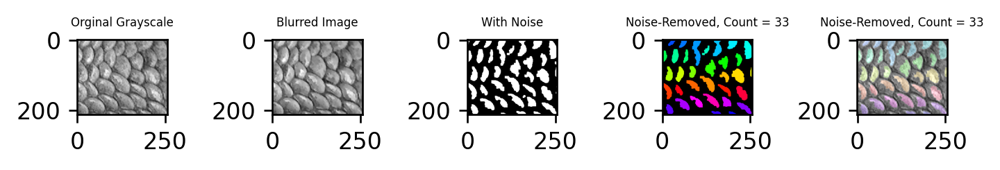

135182Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 7.63906010018723 24.585080485726934
990
Block size from formula: 36.9598751167721
Blocksize, iterations: 35, 2
Size variation: 0.46897631522582983
Distribution: 1.5917339187095072
Overall score: 1.0303551169676686

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


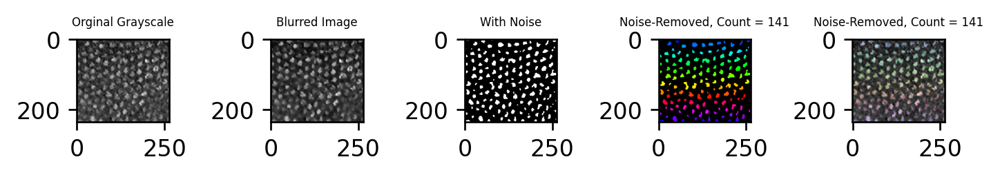

135196Ventral-NoFlash-1.png
Original Image:
avg shortest distance 7.968982719981916 33.763056311978026
1540
Block size from formula: 64.15740070738873
Blocksize, iterations: 61, 3
Size variation: 0.37968657321496835
Distribution: 4.866918124075538
Overall score: 2.6233023486452534

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


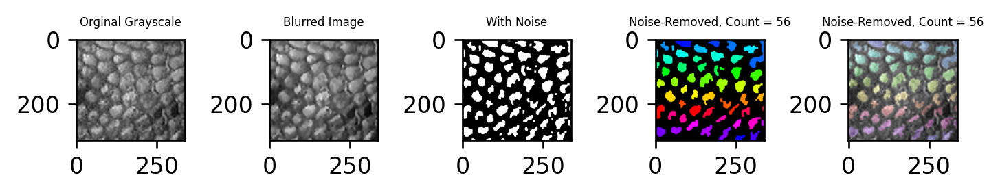

135182Dorsal-NoFlash-3.png
Original Image:
avg shortest distance 10.807569682929158 27.88505489855085
210
Block size from formula: 41.80352795511309
Blocksize, iterations: 41, 2
Size variation: 0.5696900521088955
Distribution: 2.441950383216591
Overall score: 1.5058202176627433

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


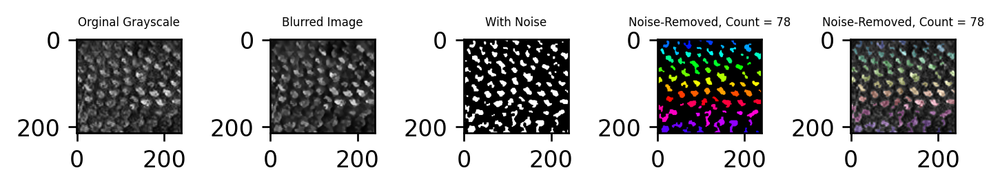

135193Ventral-NoFlash-1.png
Original Image:
avg shortest distance 6.474607061419608 36.39622059670676
861
Block size from formula: 71.34655653982688
Blocksize, iterations: 69, 3
Size variation: 0.3939375821826997
Distribution: 6.1179345237402245
Overall score: 3.255936052961462

Inverted Image:
avg shortest distance 11.460905498056729 30.362824574352405
820
Block size from formula: 59.32738173696236
Blocksize, iterations: 57, 3
Size variation: 100
Distribution: 12.915212001364536
Overall score: 56.45760600068227

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


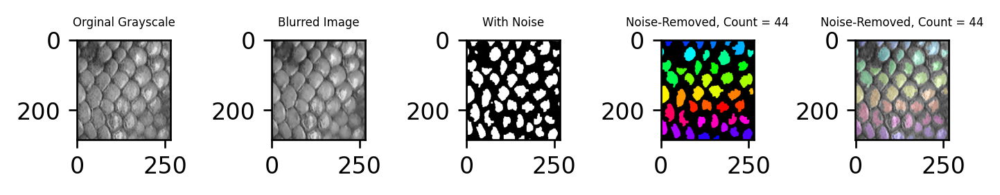

135182Ventral-NoFlash-3.png
Original Image:
avg shortest distance 6.247853299111142 25.89719538267703
351
Block size from formula: 52.18637868551907
Blocksize, iterations: 51, 3
Size variation: 0.3299695280792862
Distribution: 5.5643587660849825
Overall score: 2.9471641470821344

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


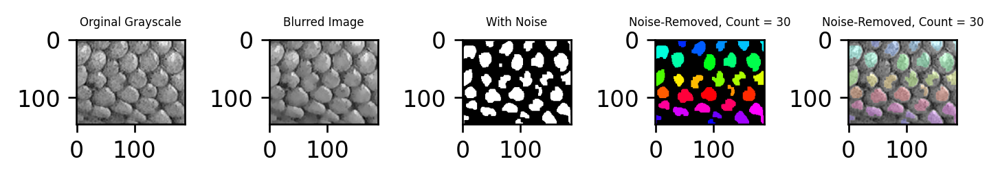

135182Ventral-NoFlash-2.png
Original Image:
avg shortest distance 5.698805052290324 30.00938100609933
465
Block size from formula: 60.493362903230974
Blocksize, iterations: 57, 3
Size variation: 0.30273449539465247
Distribution: 3.3702615095348447
Overall score: 1.8364980024647486

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


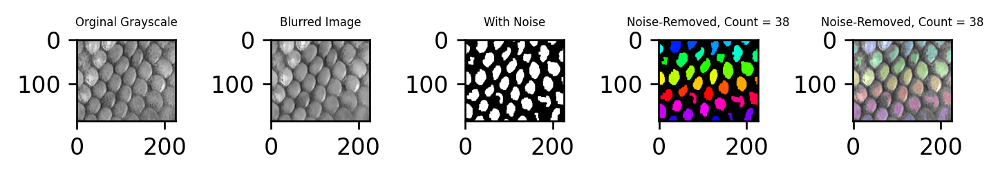

135182Ventral-NoFlash-1.png
Original Image:
avg shortest distance 5.645056337258072 28.100750786673824
300
Block size from formula: 57.41638361824948
Blocksize, iterations: 55, 3
Size variation: 0.4443672208484536
Distribution: 3.9914949495667456
Overall score: 2.2179310852075997

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


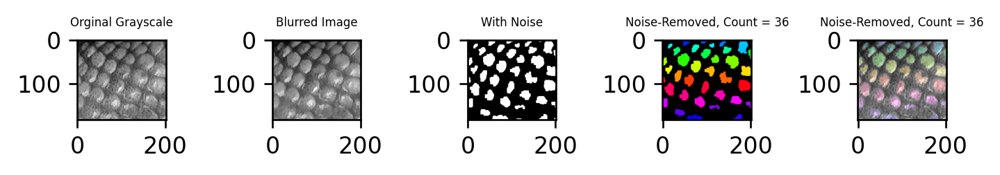

117702Ventral-NoFlash-2.png
Original Image:
avg shortest distance 15.514523417023526 46.40269312277626
465
Block size from formula: 78.6289059822003
Blocksize, iterations: 77, 3
Size variation: 0.3566126479375343
Distribution: 8.298538003016464
Overall score: 4.3275753254769995

Inverted Image:
avg shortest distance 68.5922119615017 81.87665689219475
6
Block size from formula: 280.8014363897842
Blocksize, iterations: 263, 1
Size variation: 1.3722119134905908
Distribution: 64.69077061708738
Overall score: 33.031491265288984

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


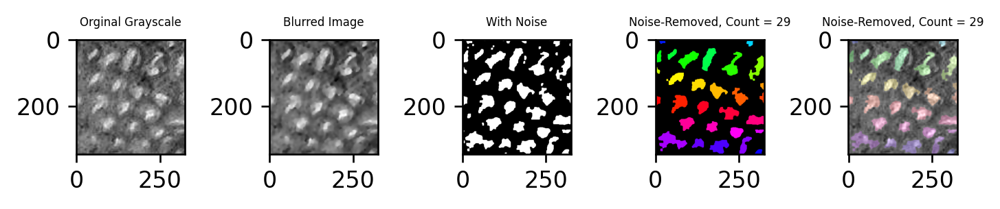

117702Ventral-NoFlash-3.png
Original Image:
avg shortest distance 21.0234231882727 54.976818985753404
28
Block size from formula: 169.82858303290828
Blocksize, iterations: 159, 1

Inverted Image:
avg shortest distance 14.091162750416451 47.600150337117775
528
Block size from formula: 89.93648079176458
Blocksize, iterations: 87, 1
Size variation: 100
Distribution: 9.847486747154495
Overall score: 54.923743373577246
Could not find 1 subimages that pass the quality check.

DECIDED TO USE INVERTED IMAGE.


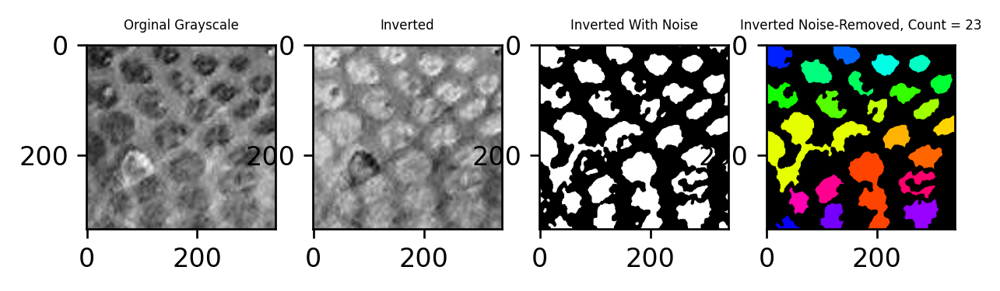

117702Ventral-NoFlash-1.png
Original Image:
avg shortest distance 14.922723455854625 40.79002782347214
435
Block size from formula: 77.44157332087423
Blocksize, iterations: 75, 3
Size variation: 0.7473284733905364
Distribution: 7.0449491256727725
Overall score: 3.8961387995316543

Inverted Image:
avg shortest distance 30.555029278188325 51.79425421629483
120
Block size from formula: 121.83906449249437
Blocksize, iterations: 115, 1

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


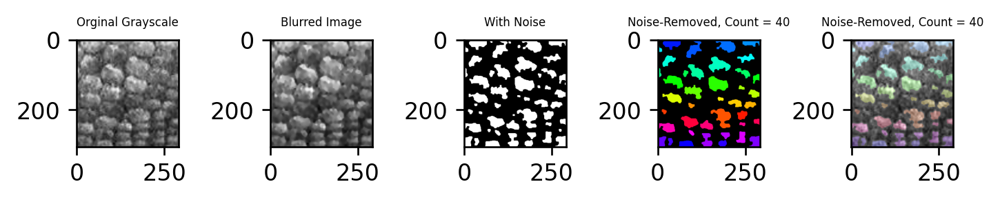

117702Ventral-NoFlash-4.png
Original Image:
avg shortest distance 20.599530329755474 43.21066436071288
300
Block size from formula: 97.46319651822498
Blocksize, iterations: 93, 1
Size variation: 0.28943047787258247
Distribution: 11.515943737430707
Overall score: 5.902687107651644

Inverted Image:
avg shortest distance 20.262287551240057 48.44795687956465
210
Block size from formula: 97.27931737612415
Blocksize, iterations: 93, 1
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


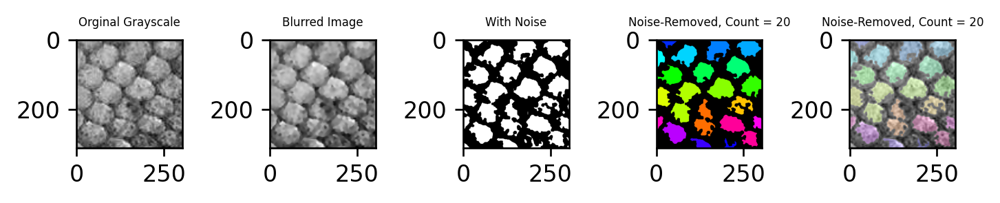

In [35]:
run_count_on_directory('Guanica_County_images/')

In [ ]:
directory = 'small/'

run_count_on_directory(directory)



SUBIMAGE #0:

Original Image:
avg shortest distance 5.892733183732437 28.536388603419727
1540
Block size from formula: 51.58894748667738
Blocksize, iterations: 49, 3
Size variation: 0.5497653875867281
Distribution: 4.483992771052149
Overall score: 2.5168790793194384

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


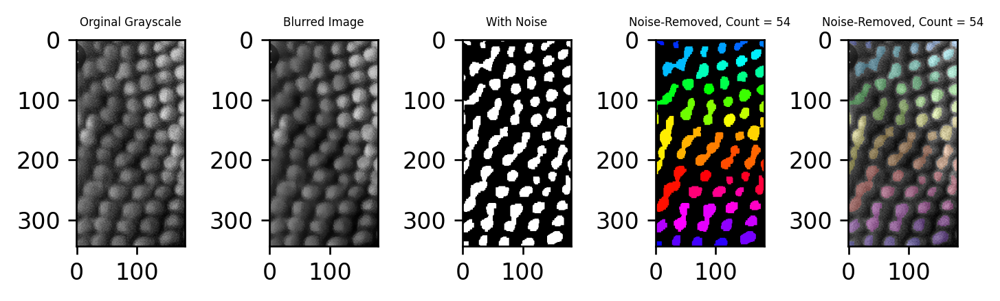

SUBIMAGE #1:

Original Image:
avg shortest distance 7.422730833834294 28.702827411157347
780
Block size from formula: 61.30253012230244
Blocksize, iterations: 59, 3
Size variation: 0.5342771031842836
Distribution: 4.825261868278103
Overall score: 2.6797694857311933

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


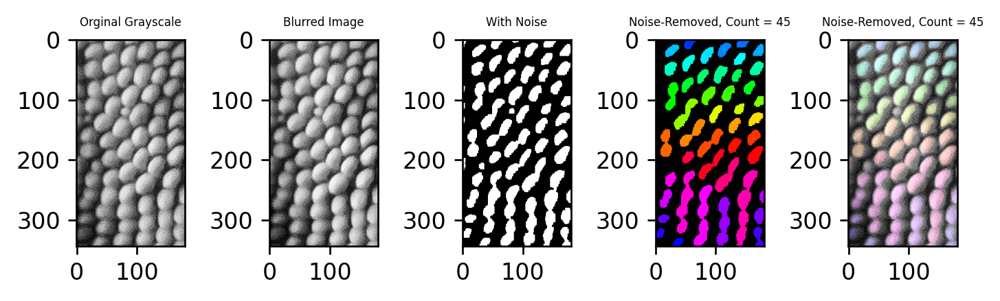

SUBIMAGE #2:

Original Image:
avg shortest distance 4.873492548166773 28.104365446114635
903
Block size from formula: 54.8095148515647
Blocksize, iterations: 53, 3
Size variation: 0.5055048130031484
Distribution: 3.4311894233597413
Overall score: 1.968347118181445

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


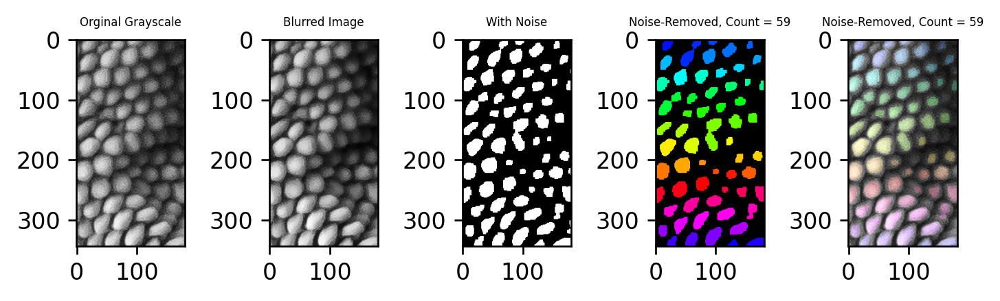

SUBIMAGE #3:

Original Image:
avg shortest distance 7.119537443871176 30.04815610441315
325
Block size from formula: 59.14047853293797
Blocksize, iterations: 57, 3
Size variation: 0.7039166116674735
Distribution: 4.745319885473491
Overall score: 2.7246182485704824

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


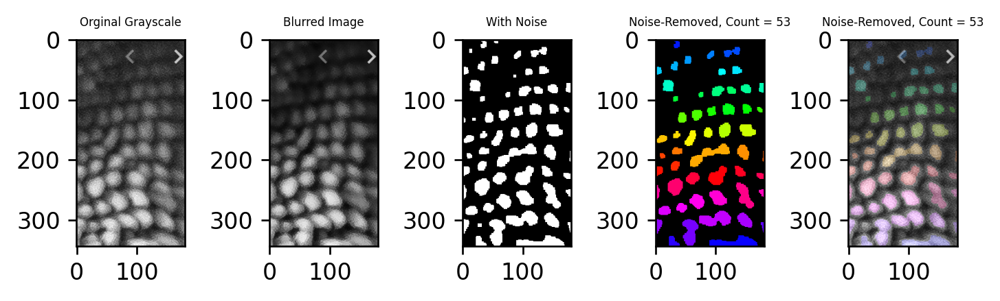

SUBIMAGE #4:

Original Image:
avg shortest distance 4.406948396433096 25.96829598535269
2346
Block size from formula: 49.42261653980265
Blocksize, iterations: 47, 3
Size variation: 0.36735245061457344
Distribution: 2.8059658236171474
Overall score: 1.5866591371158605

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


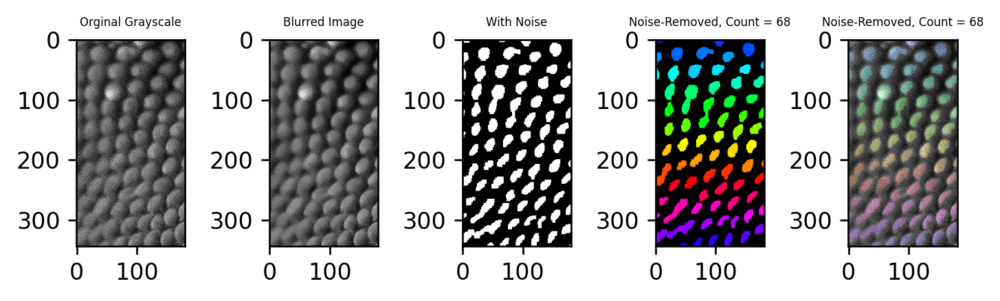

SUBIMAGE #5:

Original Image:
avg shortest distance 6.266786480388064 25.03431223580138
1891
Block size from formula: 45.602446577907685
Blocksize, iterations: 45, 3
Size variation: 0.2582167773433039
Distribution: 2.809364793173854
Overall score: 1.533790785258579

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


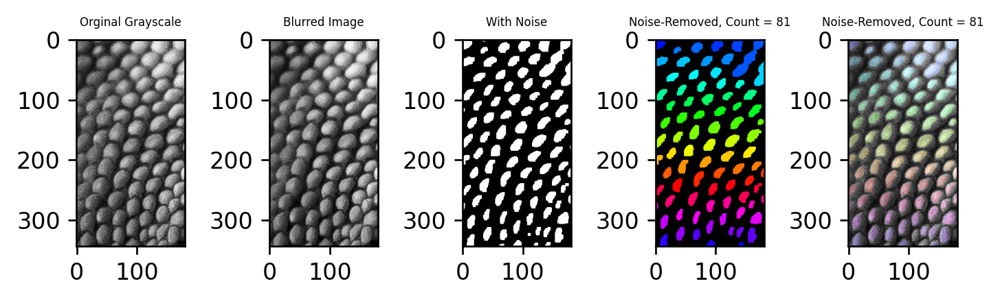

SUBIMAGE #6:

Original Image:
avg shortest distance 6.798895357528146 25.301104540124317
1653
Block size from formula: 50.994744969699966
Blocksize, iterations: 49, 3
Size variation: 100
Distribution: 3.877991186759047
Overall score: 51.93899559337952

Inverted Image:
avg shortest distance 7.343937249329344 29.318149746896463
741
Block size from formula: 56.37414565616963
Blocksize, iterations: 55, 3
Size variation: 100
Distribution: 7.372383199865256
Overall score: 53.68619159993263
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


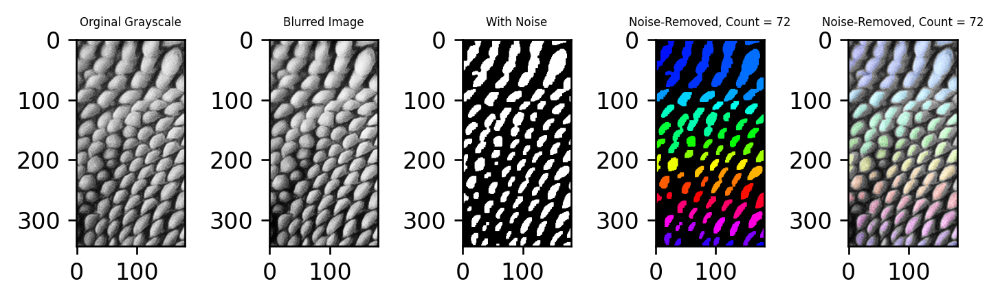

SUBIMAGE #7:

Original Image:
avg shortest distance 7.689155837503485 25.366770130738537
1378
Block size from formula: 53.94071272061453
Blocksize, iterations: 51, 3
Size variation: 0.5615148767078862
Distribution: 3.5407321408376156
Overall score: 2.051123508772751

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


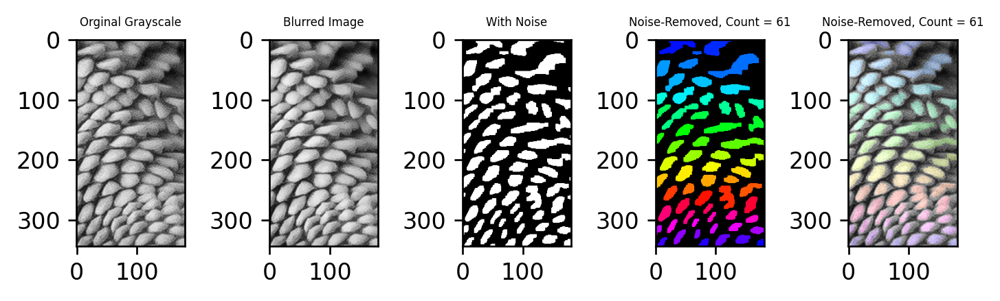

SUBIMAGE #8:

Original Image:
avg shortest distance 5.153346627464778 25.18425512135282
2628
Block size from formula: 48.47047645507533
Blocksize, iterations: 47, 3
Size variation: 0.29279995591664204
Distribution: 2.402834280719165
Overall score: 1.3478171183179035

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


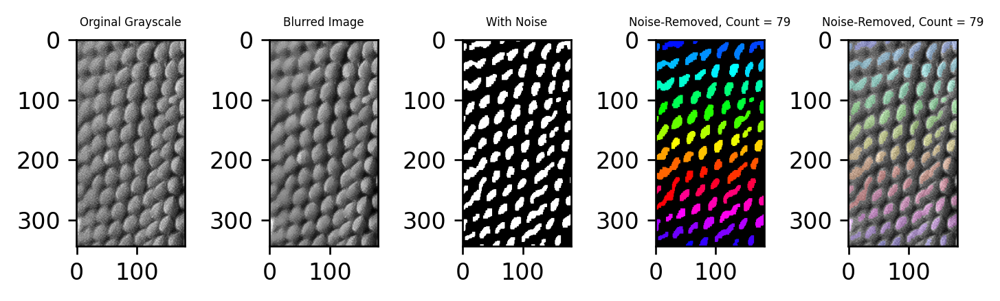

SUBIMAGE #9:

Original Image:
avg shortest distance 4.111363421810345 22.54851939429188
2850
Block size from formula: 40.84427043829099
Blocksize, iterations: 39, 2
Size variation: 0.497175278585999
Distribution: 2.672463620814001
Overall score: 1.5848194497

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


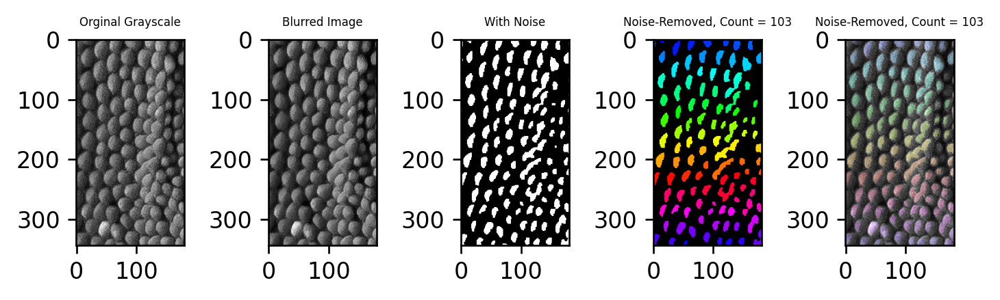

SUBIMAGE #10:

Original Image:
avg shortest distance 4.954168141720344 21.86987187983476
2278
Block size from formula: 41.189441672232945
Blocksize, iterations: 39, 2
Size variation: 100
Distribution: 2.3625541420355667
Overall score: 51.18127707101778

Inverted Image:
avg shortest distance 8.125632944621373 23.649352729292467
1275
Block size from formula: 44.67433539225223
Blocksize, iterations: 43, 2
Size variation: 100
Distribution: 5.8290494013485725
Overall score: 52.914524700674285
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


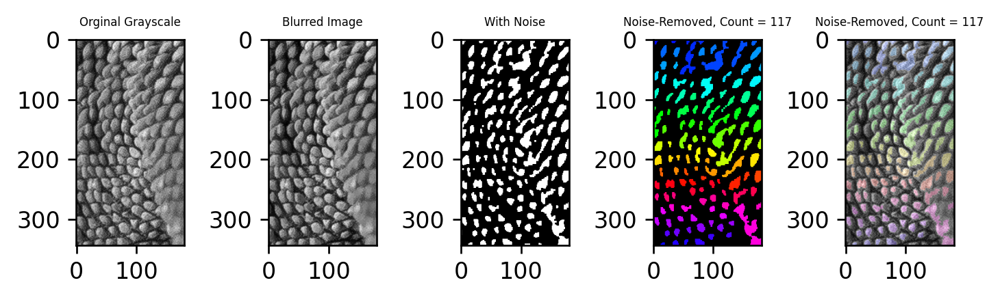

SUBIMAGE #11:

Original Image:
avg shortest distance 6.421024891545399 25.601303593284864
2080
Block size from formula: 45.70439176472338
Blocksize, iterations: 45, 3
Size variation: 0.3370124799060778
Distribution: 3.2028402970747543
Overall score: 1.769926388490416

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


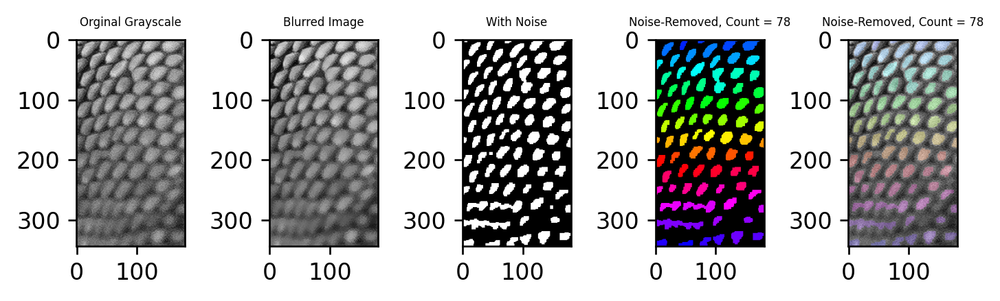

ESTIMATED TOTAL COUNT: 876.6666666666666 SCALES

_______________________________________________

SELECTED SUBIMAGES: [5, 8, 9]


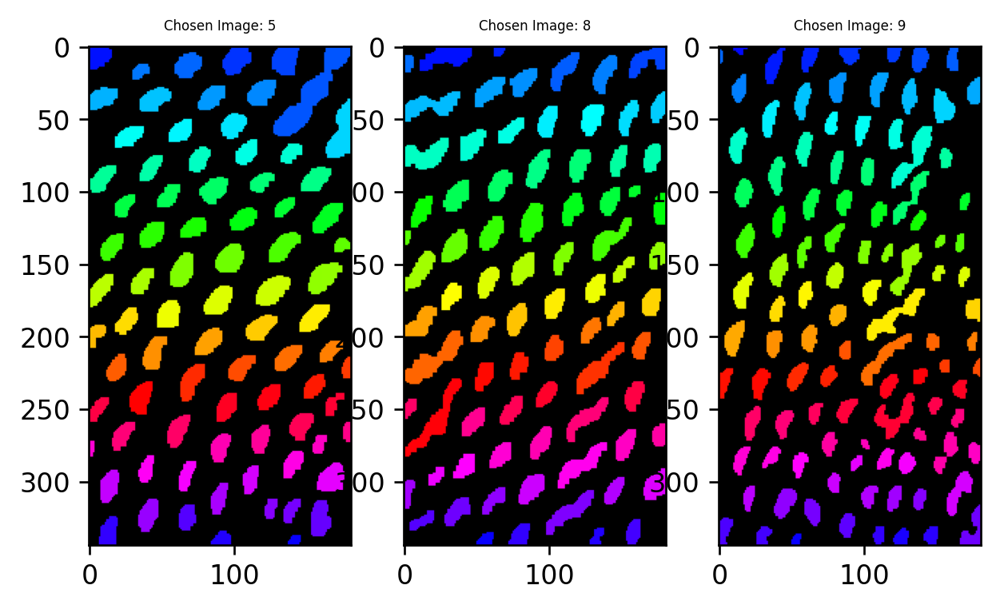

In [44]:
split_count_select('small/small2.png', 10, 3)